In [1]:
# import spacec first
import spacec as sp

#import standard packages
import os
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

# silencing warnings
import warnings
warnings.filterwarnings('ignore')

plt.rc('axes', grid=False)  # remove gridlines
sc.settings.set_figure_params(dpi=80, facecolor='white') # set dpi and background color for scanpy figures


/dss/dsshome1/00/ge65tib2/miniconda3/envs/spacec/lib/python3.10/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound
2025-06-26 19:14:54.036689: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/compat/lib.real:/usr/local/cuda/extras/CUPTI/lib64:/usr/local/cuda/compat/lib:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2025-06-26 19:14:54.036752: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
INFO:root: * TissUUmaps version: 3.1.1.6


In [2]:
# Specify the path to the data
root_path = "/dss/dsshome1/00/ge65tib2/Spacec/" # replace with your path
data_path = root_path + 'example_data/raw/' # where the data is stored

# where you want to store the output
output_dir = root_path + 'example_data/output/'
os.makedirs(output_dir, exist_ok=True)

In [3]:
adata = sc.read(output_dir + 'adata_cellpose_nn_demo.h5ad')
adata # check the adata

AnnData object with n_obs × n_vars = 15385 × 39
    obs: 'DAPI', 'x', 'y', 'area', 'region_num', 'unique_region', 'condition'

In [4]:
print(adata.obs['unique_region'].unique())

['2_4', '5_5']
Categories (2, object): ['2_4', '5_5']


In [5]:
adata_2_4 = adata[adata.obs['unique_region'] == '2_4'].copy()
adata_5_5 = adata[adata.obs['unique_region'] == '5_5'].copy()

In [6]:
adata_2_4

AnnData object with n_obs × n_vars = 5961 × 39
    obs: 'DAPI', 'x', 'y', 'area', 'region_num', 'unique_region', 'condition'

In [7]:
adata_5_5

AnnData object with n_obs × n_vars = 9424 × 39
    obs: 'DAPI', 'x', 'y', 'area', 'region_num', 'unique_region', 'condition'

In [8]:
clustering_random_seed = 7

Computing neighbors and UMAP
- neighbors
- UMAP
Clustering
Leiden clustering


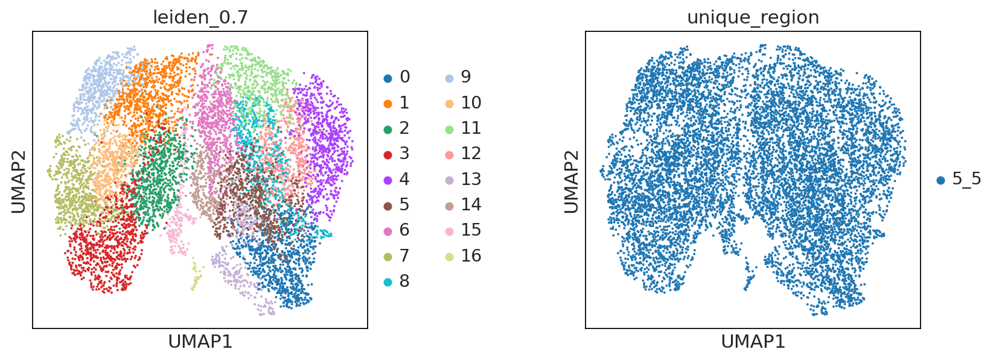

In [9]:
marker_list = [
    'SOX2', 'FAP', 'cxcr3', 'LRRC15', 'CD20', 'CD68', 'CD45RO', 
    'CD31', 'PD-1', 'Ki67', 'Keratin 5', 'CD4', 'IFNG', 'SMA', 'CD66', 
    'Podoplanin', 'CXCR4', 'PGRN', 'Granzyme B', 'Pan-Cytokeratin', 'MARCO', 
    'CD56', 'HAS1', 'CD107a', 'b-Catenin1', 'HLA-A', 'HLA-DR', 'CD8', 'PDL1', 
    'TP63', 'GATA6', 'CD34', 'TCF-1', 'Bcl-2', 'PCNA', 'CLDN18', 'CD3e', 'MCT4', 'LAG3']

adata_leiden = sp.tl.clustering(
    adata_5_5, 
    clustering='leiden', # can choose between leiden and louvian
    n_neighbors= 10, # number of neighbors for the knn graph
    resolution = 0.7, #clustering resolution (higher resolution gives more clusters)
    reclustering = False, # if true, no computing the neighbors
    marker_list = marker_list, #if it is None, all variable names are used for clustering
    seed=clustering_random_seed, # random seed for clustering - reproducibility
)

# visualization of clustering with UMAP
sc.pl.umap(adata_leiden, color = ['leiden_0.7', 'unique_region'], wspace=0.5)

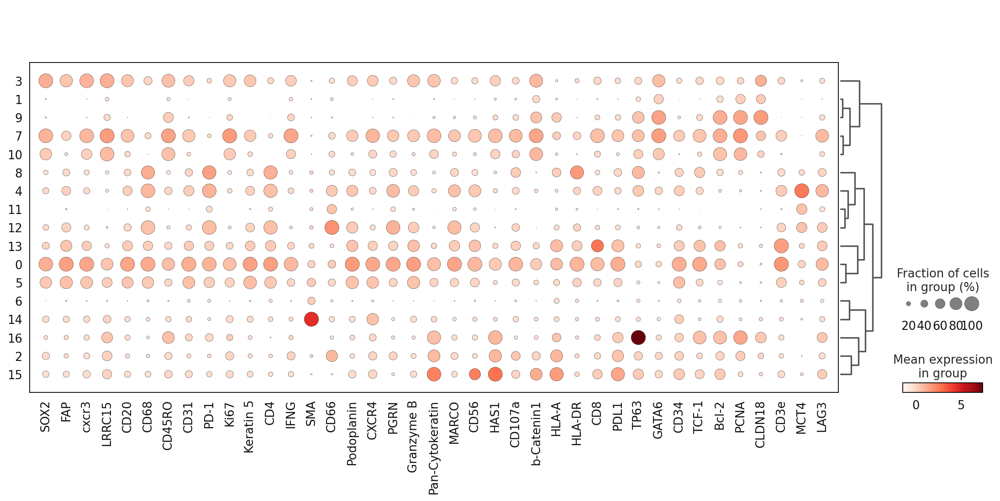

In [10]:
sc.pl.dotplot(adata_leiden, 
              marker_list, # The list of markers to show on the x-axis
              'leiden_0.7', # The cluster column
              dendrogram = True) # Show the dendrogram

In [11]:
# subclustering cluster 0, 3, 4 sequentially (could be optional for your own data)
sc.tl.leiden(adata_leiden, 
             seed=clustering_random_seed, # random seed for clustering - reproducibility
             restrict_to=('leiden_0.7',['0']), # select the cluster column name (your previously generated key) and the cluster name you want to subcluster
             resolution=0.3, # resolution for subclustering
             key_added='leiden_0.7_subcluster') # key added to adata.obs (keep it the same to avoid confusion and limit the adata object size)

# repeat the same for other clusters you want to subcluster
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['2']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['3']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['4']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['5']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['7']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['8']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['10']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['12']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['13']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['15']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['16']), resolution=0.3, key_added='leiden_0.7_subcluster')


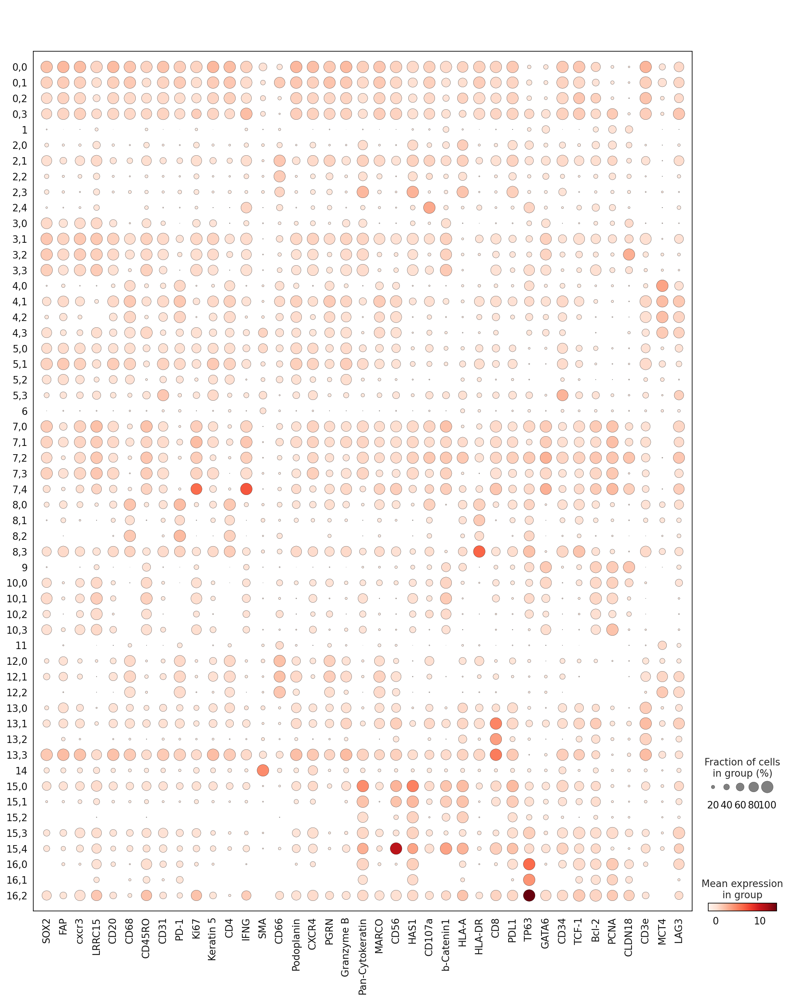

In [12]:
# Visualize cluster expression profiles 
sc.pl.dotplot(adata_leiden, 
              marker_list, 
              'leiden_0.7_subcluster', # The cluster column (now use the subcluster column)
              dendrogram = False)



In [13]:
# tentative annotation based on the marker 
# tentative annotation based on the marker 
cluster_to_ct_dict = {
    '0,0': 'recluster',
    '0,1': 'recluster',
    '0,2': 'recluster',
    '0,3': 'recluster',
    '1': 'Noise',
    '2,0': 'basal tumor cells and iCAFs',
    '2,1': 'recluster',
    '2,2': 'iCAFs',
    '2,3': 'iCAFs',
    '2,4': 'recluster',
    '3,0': 'myCAFs',
    '3,1': 'recluster',
    '3,2':'recluster',
    '3,3': 'recluster',
    '4,0': 'myCAFs',
    '4,1': 'recluster',
    '4,2':'recluster',
    '4,3': 'recluster',
    '5,0': 'recluster',
    '5,1': 'recluster',
    '5,2':'recluster',
    '5,3': 'Endothelial cells and basal tumor cells',
    '6': 'Noise',
    '7,0': 'recluster',
    '7,1': 'recluster',
    '7,2': 'recluster',
    '7,3': 'recluster',
    '7,4': 'recluster',
    '8,0': 'recluster',
    '8,1': 'M1, Helper T and basal tumor cells',
    '8,2': 'M1, Helper T and basal tumor cells',
    '8,3': 'recluster',
    '9': 'basal and classical tumor cells',
    '10,0': 'classical tumor cells and myCAFs, iCAFs',
    '10,1': 'basal tumor cells and myCAFs',
    '10,2': 'basal tumor cells',
    '10,3': 'classical tumor cells and myCAFs',
    '11': 'Noise',
    '12,0': 'M2, Helper T and NK cells',
    '12,1': 'M2, Helper T and NK cells',
    '12,2': 'M2, Helper T and NK cells',
    '13,0': 'recluster',
    '13,1': 'recluster',
    '13,2': 'Cytotoxic T',
    '13,3': 'recluster',
    '14': 'myCAFs',  
    '15,0': 'recluster',
    '15,1': 'recluster',
    '15,2': 'iCAFs',
    '15,3': 'recluster',
    '15,4': 'recluster',
    '16,0': 'basal tumor cells and myCAFs, iCAFs',
    '16,1': 'basal tumor cells and iCAFs',
    '16,2': 'recluster',
}

# This allows us to generate a new column named cell_type_coarse based on the leiden_1_subcluster column
adata_leiden.obs['cell_type_coarse'] = ( # create a new column
    adata_leiden.obs['leiden_0.7_subcluster'] # get the cluster names
    .map(cluster_to_ct_dict) # map the cluster names to cell types
    .astype('category') # convert to category
)

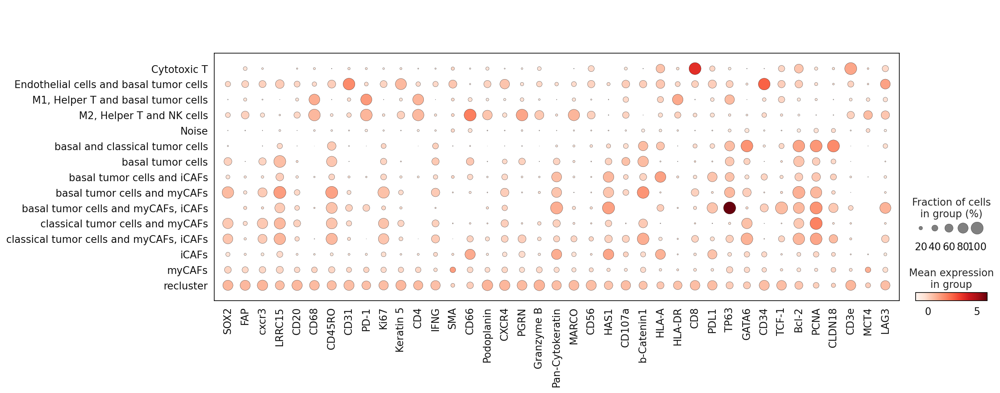

In [14]:
# Check the marker expression of the annotated cell types
sc.pl.dotplot(adata_leiden, marker_list, 'cell_type_coarse', dendrogram = False)

,x,y,cell_type_coarse,condition
0,1437.616279,312.941860,Noise,liver
1,1479.093750,311.375000,Noise,liver
2,1460.806818,318.613636,basal tumor cells and iCAFs,liver
3,1488.090909,315.515152,Noise,liver
4,1336.684783,318.358696,recluster,liver
...,...,...,...,...
9419,1545.444444,2745.888889,myCAFs,liver
9420,1628.720930,2747.930233,myCAFs,liver
9421,1524.904762,2750.380952,myCAFs,liver
9422,1621.111111,2750.555556,myCAFs,liver


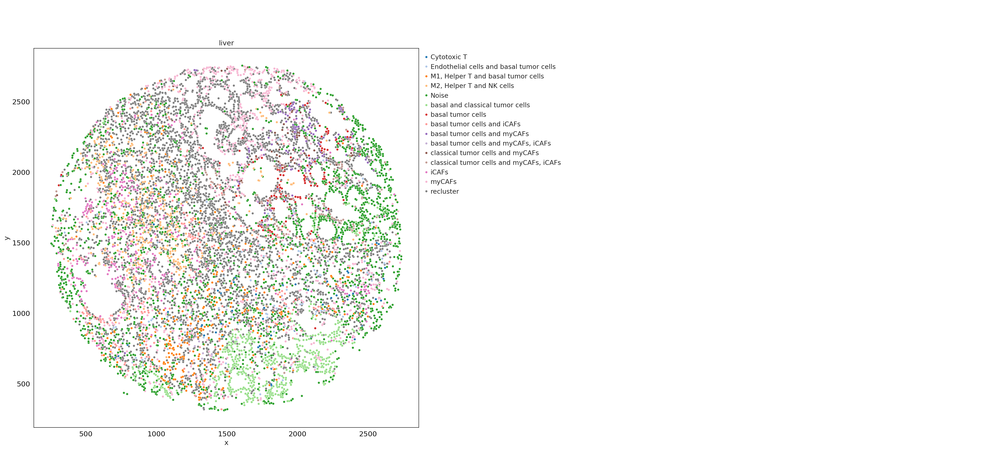

In [15]:
sp.pl.catplot(
    adata_leiden, 
    color = "cell_type_coarse", # specify group column name here (e.g. celltype_fine)
    unique_region = "condition", # specify unique_regions here
    X='x', Y='y', # specify x and y columns here
    n_columns=2, # adjust the number of columns for plotting here (how many plots do you want in one row?)
    palette='tab20', #default is None which means the color comes from the anndata.uns that matches the UMAP
    savefig=True, # save figure as pdf
    output_fname = "2_4_first_clustering", # change it to file name you prefer when saving the figure
    output_dir=output_dir, # specify output directory here (if savefig=True)
    figsize= 17, # specify the figure size here
    size = 20) # specify the size of the points

In [16]:
# print the frequencies of cell types
adata_leiden.obs['cell_type_coarse'].value_counts()

cell_type_coarse
recluster                                  3928
Noise                                      1953
myCAFs                                      859
basal and classical tumor cells             592
M2, Helper T and NK cells                   468
M1, Helper T and basal tumor cells          338
iCAFs                                       331
basal tumor cells and iCAFs                 240
classical tumor cells and myCAFs, iCAFs     199
basal tumor cells and myCAFs                127
Endothelial cells and basal tumor cells     123
basal tumor cells                           119
classical tumor cells and myCAFs             80
Cytotoxic T                                  50
basal tumor cells and myCAFs, iCAFs          17
Name: count, dtype: int64

In [17]:
sc.tl.leiden(adata_leiden, 
             seed=clustering_random_seed, 
             restrict_to=('cell_type_coarse',['recluster']), # select the cluster column name (your previously generated key) and the cluster name you want to subcluster
             resolution=1.5,
             key_added='cell_type_coarse_subcluster') # new column added to adata.obs

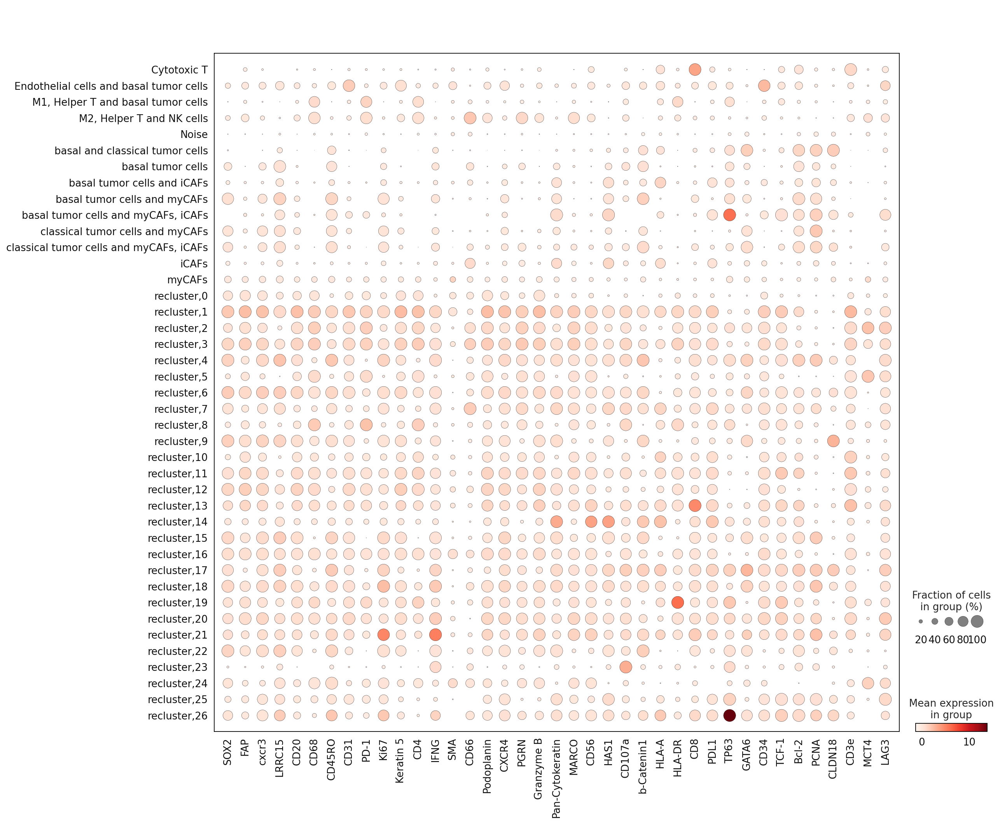

In [18]:
sc.pl.dotplot(adata_leiden, marker_list, 'cell_type_coarse_subcluster', dendrogram = False)

In [19]:
# tentative annotation based on the marker 
cluster_to_ct_dict = {  
    'Noise': 'Noise',
    'myCAFs': 'myCAFs',
    'iCAFs': 'iCAFs', 
    'basal tumor cells':'basal tumor cells',
    'basal tumor cells and myCAFs, iCAFs': 'recluster',
    'basal and classical tumor cells': 'basal and classical tumor cells',
    'basal tumor cells and iCAFs':'basal tumor cells and iCAFs',
    'basal tumor cells and myCAFs':'basal tumor cells and myCAFs',
    'classical tumor cells and myCAFs, iCAFs':'classical tumor cells and myCAFs, iCAFs',
    'classical tumor cells and myCAFs':'classical tumor cells and myCAFs',
    'M2, Helper T and NK cells':'M2, Helper T and NK cells',
    'M1, Helper T and basal tumor cells':'M1, Helper T and basal tumor cells',
    'Endothelial cells and basal tumor cells':'Endothelial cells and basal tumor cells',
    'Cytotoxic T': 'Cytotoxic T cells',
    'recluster,0': 'recluster',
    'recluster,1': 'recluster',
    'recluster,2': 'recluster',
    'recluster,3': 'recluster',
    'recluster,4': 'recluster',
    'recluster,5': 'recluster',
    'recluster,6': 'recluster',
    'recluster,7': 'recluster',
    'recluster,8': 'recluster',
    'recluster,9': 'recluster',
    'recluster,10': 'recluster',
    'recluster,11': 'recluster',
    'recluster,12': 'recluster',
    'recluster,13': 'recluster',
    'recluster,14': 'recluster',
    'recluster,15': 'recluster',
    'recluster,16': 'recluster',
    'recluster,17': 'recluster',
    'recluster,18': 'recluster',
    'recluster,19': 'recluster',
    'recluster,20': 'recluster',
    'recluster,21': 'recluster',
    'recluster,22': 'recluster',
    'recluster,23': 'basal tumor cells and NK cells',
    'recluster,24': 'recluster',
    'recluster,25': 'recluster',
    'recluster,26': 'recluster',

}

adata_leiden.obs['cell_type_coarse_f'] = (
    adata_leiden.obs['cell_type_coarse_subcluster']
    .map(cluster_to_ct_dict)
    .astype('category')
)

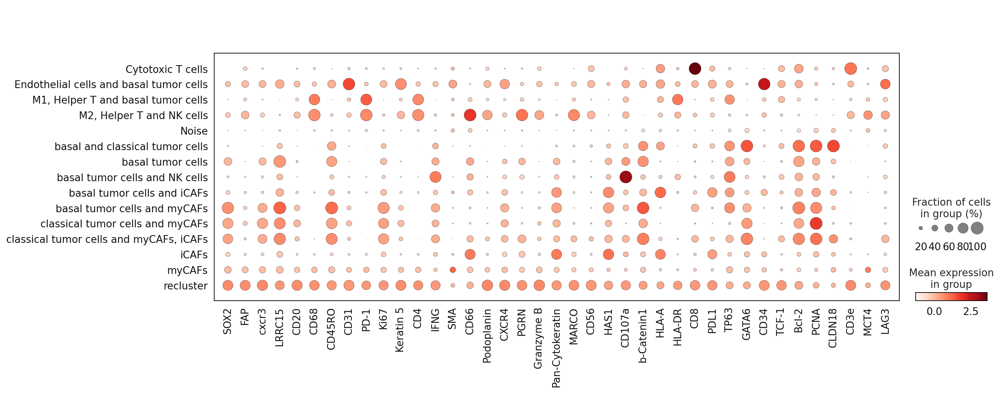

In [20]:
sc.pl.dotplot(adata_leiden, marker_list, 'cell_type_coarse_f', dendrogram = False)

In [21]:
adata_leiden.obs['cell_type_coarse_f'].value_counts()


cell_type_coarse_f
recluster                                  3895
Noise                                      1953
myCAFs                                      859
basal and classical tumor cells             592
M2, Helper T and NK cells                   468
M1, Helper T and basal tumor cells          338
iCAFs                                       331
basal tumor cells and iCAFs                 240
classical tumor cells and myCAFs, iCAFs     199
basal tumor cells and myCAFs                127
Endothelial cells and basal tumor cells     123
basal tumor cells                           119
classical tumor cells and myCAFs             80
Cytotoxic T cells                            50
basal tumor cells and NK cells               50
Name: count, dtype: int64

In [22]:
adata = adata_leiden[~adata_leiden.obs['cell_type_coarse_f'].isin(['Noise'])]


In [23]:
sc.tl.leiden(adata, seed=clustering_random_seed, restrict_to=('cell_type_coarse_f',['recluster']), resolution=1.5, key_added='cell_type_coarse_f_subcluster')

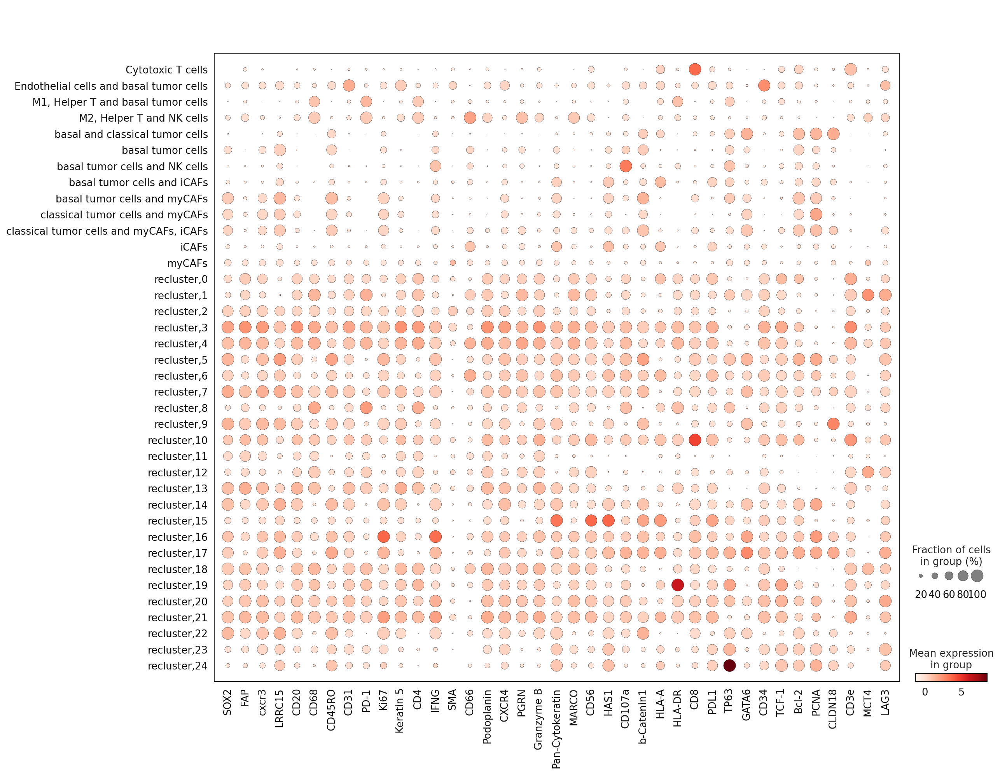

In [24]:
sc.pl.dotplot(adata, marker_list, 'cell_type_coarse_f_subcluster', dendrogram = False)

In [25]:
# scale and store results in layer
adata.layers["scaled"] = sc.pp.scale(adata, copy=True).X

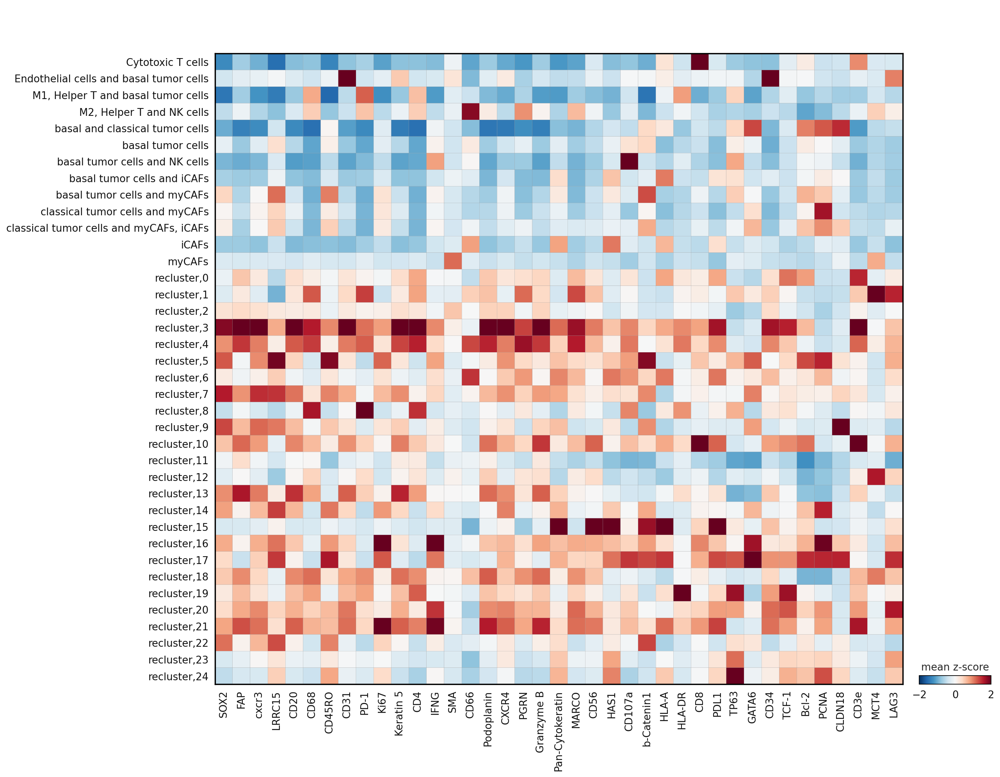

In [26]:
sc.pl.matrixplot(
    adata,
    marker_list,
    "cell_type_coarse_f_subcluster",
    dendrogram=False,
    colorbar_title="mean z-score",
    layer="scaled",
    vmin=-2,
    vmax=2,
    cmap="RdBu_r",
)

In [27]:
# tentative annotation based on the marker 
cluster_to_ct_dict = {  
    'Noise': 'Noise',
    'myCAFs': 'myCAFs',
    'iCAFs': 'iCAFs', 
    'basal tumor cells': 'basal tumor cells',
    'basal tumor cells and NK cells': 'basal tumor cells and NK cells',
    'basal and classical tumor cells': 'basal and classical tumor cells',
    'basal tumor cells and iCAFs':'basal tumor cells and iCAFs',
    'basal tumor cells and myCAFs':'basal tumor cells and myCAFs',
    'classical tumor cells and myCAFs, iCAFs':'classical tumor cells and myCAFs, iCAFs',
    'classical tumor cells and myCAFs':'classical tumor cells and myCAFs',
    'M2, Helper T and NK cells':'M2, Helper T and NK cells',
    'M1, Helper T and basal tumor cells':'M1, Helper T and basal tumor cells',
    'Endothelial cells and basal tumor cells':'Endothelial cells and basal tumor cells',
    'Cytotoxic T cells': 'Cytotoxic T cells',
    
    'recluster,0': 'recluster',
    'recluster,1': 'M2 and Helper T',
    'recluster,2': 'Noise',
    'recluster,3': 'recluster',
    'recluster,4': 'recluster',
    'recluster,5': 'recluster',
    'recluster,6': 'recluster',
    'recluster,7': 'recluster',
    'recluster,8': 'recluster',
    'recluster,9': 'recluster',
    'recluster,10': 'recluster',
    'recluster,11': 'Noise',
    'recluster,12': 'Noise',
    'recluster,13': 'recluster',
    'recluster,14': 'classical tumor cells and myCAFs, iCAFs',
    'recluster,15': 'recluster',
    'recluster,16': 'recluster',
    'recluster,17': 'recluster',
    'recluster,18': 'recluster',
    'recluster,19': 'recluster',
    'recluster,20': 'recluster',
    'recluster,21': 'recluster',
    'recluster,22': 'myCAFs',
    'recluster,23': 'basal tumor cells and iCAFs',
    'recluster,24': 'basal tumor cells and iCAFs',


}


adata.obs['cell_type'] = (
    adata.obs['cell_type_coarse_f_subcluster']
    .map(cluster_to_ct_dict)
    .astype('category')
)

In [28]:
adata = adata[~adata.obs['cell_type'].isin(['Noise'])]


In [29]:
unmapped = set(adata.obs['cell_type_coarse_f_subcluster'].unique()) - set(cluster_to_ct_dict.keys())
print("Unmapped clusters:", unmapped)

Unmapped clusters: set()


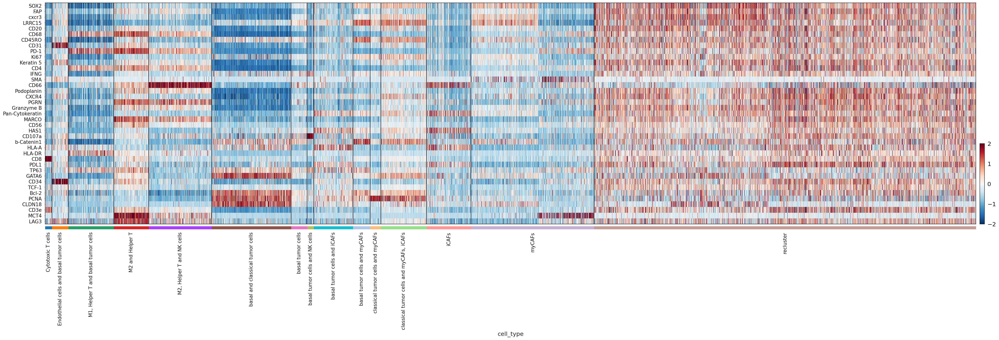

In [30]:
sc.pl.heatmap(
    adata,
    marker_list,
    groupby="cell_type",
    layer="scaled",
    vmin=-2,
    vmax=2,
    cmap="RdBu_r",
    dendrogram=False,
    swap_axes=True,
    figsize=(40, 10),
    show=True
)

In [31]:
adata.write(output_dir + "adata_nn_demo_annotated_only_5_5.h5ad")

In [32]:
adata.obs['cell_type'].value_counts()

cell_type
recluster                                  2842
myCAFs                                      916
basal and classical tumor cells             592
M2, Helper T and NK cells                   468
classical tumor cells and myCAFs, iCAFs     340
M1, Helper T and basal tumor cells          338
iCAFs                                       331
basal tumor cells and iCAFs                 291
M2 and Helper T                             260
basal tumor cells and myCAFs                127
Endothelial cells and basal tumor cells     123
basal tumor cells                           119
classical tumor cells and myCAFs             80
Cytotoxic T cells                            50
basal tumor cells and NK cells               50
Name: count, dtype: int64

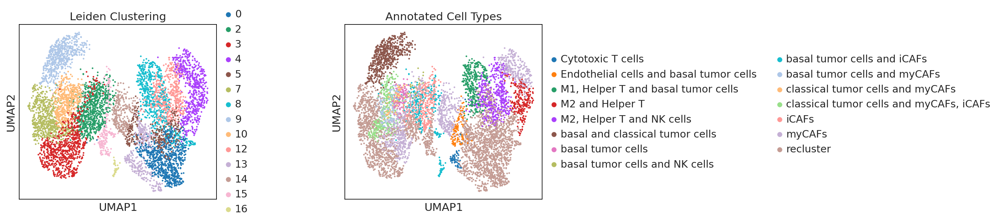

In [33]:
sc.pl.umap(adata, color = ['leiden_0.7', 'cell_type'], title=['Leiden Clustering', 'Annotated Cell Types'], wspace=0.5)

In [57]:
cell_type_colors = {
    'myCAFs': '#1f77b4',
    'iCAFs': '#ff7f0e', 
    'basal tumor cells': '#2ca02c',
    'basal tumor cells and NK cells': '#d62728',
    'basal and classical tumor cells': '#9467bd',
    'basal tumor cells and iCAFs':'#041f1e',
    'basal tumor cells and myCAFs':'#321325',
    'classical tumor cells and myCAFs, iCAFs':'#5f0f40',
    'classical tumor cells and myCAFs':'#bcbd22',
    'M2, Helper T and NK cells':'#7f7f7f',
    'M1, Helper T and basal tumor cells':'#17becf',
    'Endothelial cells and basal tumor cells':'#e377c2',
    'Cytotoxic T cells': '#f7dba7',
    'recluster':'#000009',
    'M2 and Helper T':'#0ff4c6',
}

,x,y,cell_type,condition
2,1460.806818,318.613636,basal tumor cells and iCAFs,liver
4,1336.684783,318.358696,recluster,liver
9,1334.279070,328.215116,recluster,liver
11,1420.541667,329.291667,basal and classical tumor cells,liver
13,1623.440273,347.976109,basal and classical tumor cells,liver
...,...,...,...,...
9416,1413.447761,2744.328358,myCAFs,liver
9419,1545.444444,2745.888889,myCAFs,liver
9420,1628.720930,2747.930233,myCAFs,liver
9421,1524.904762,2750.380952,myCAFs,liver


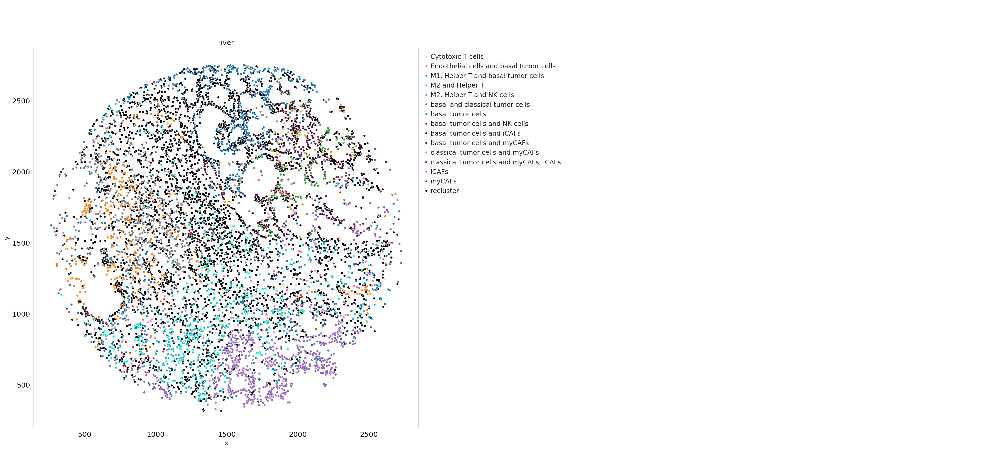

In [58]:
sp.pl.catplot(
    adata, 
    color = "cell_type", # specify group column name here (e.g. celltype_fine)
    unique_region = "condition", # specify unique_regions here
    X='x', Y='y', # specify x and y columns here
    n_columns=2, # adjust the number of columns for plotting here (how many plots do you want in one row?)
    palette=cell_type_colors, #default is None which means the color comes from the anndata.uns that matches the UMAP
    savefig=True, # save figure as pdf
    output_fname = "cell_type_tma_only_5_5", # change it to file name you prefer when saving the figure
    output_dir=output_dir, # specify output directory here (if savefig=True)
    figsize= 17,
    size = 20)

In [59]:
cell_type_colors_1 = {
    'myCAFs': '#1f77b4',
    'iCAFs': '#ff7f0e', 
    'basal tumor cells': '#2ca02c',
    'basal tumor cells and NK cells': '#d62728',
    'basal and classical tumor cells': '#9467bd',
    'basal tumor cells and iCAFs':'#041f1e',
    'basal tumor cells and myCAFs':'#321325',
    'classical tumor cells and myCAFs, iCAFs':'#5f0f40',
    'classical tumor cells and myCAFs':'#bcbd22',
    'M2, Helper T and NK cells':'#7f7f7f',
    'M1, Helper T and basal tumor cells':'#17becf',
    'Endothelial cells and basal tumor cells':'#e377c2',
    'Cytotoxic T cells': '#f7dba7',
    'recluster':'white',
    'M2 and Helper T':'#0ff4c6',
}

,x,y,cell_type,condition
2,1460.806818,318.613636,basal tumor cells and iCAFs,liver
4,1336.684783,318.358696,recluster,liver
9,1334.279070,328.215116,recluster,liver
11,1420.541667,329.291667,basal and classical tumor cells,liver
13,1623.440273,347.976109,basal and classical tumor cells,liver
...,...,...,...,...
9416,1413.447761,2744.328358,myCAFs,liver
9419,1545.444444,2745.888889,myCAFs,liver
9420,1628.720930,2747.930233,myCAFs,liver
9421,1524.904762,2750.380952,myCAFs,liver


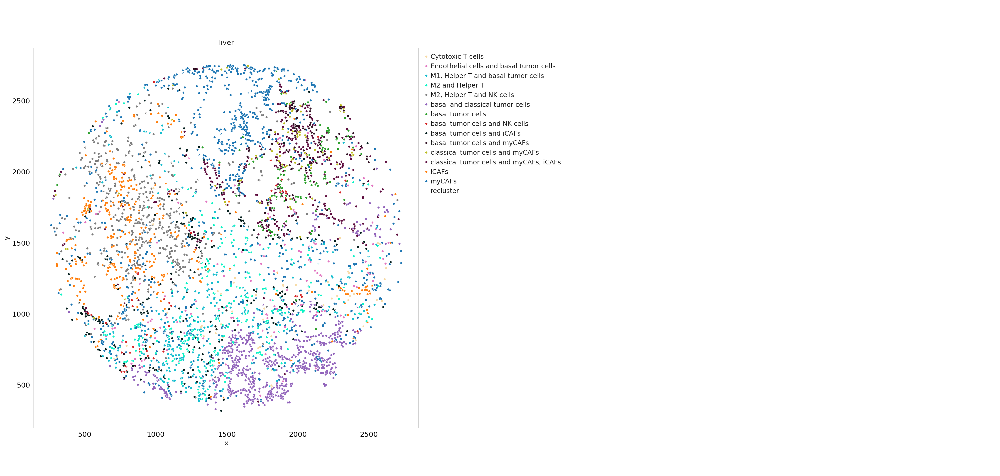

In [60]:
sp.pl.catplot(
    adata, 
    color = "cell_type", # specify group column name here (e.g. celltype_fine)
    unique_region = "condition", # specify unique_regions here
    X='x', Y='y', # specify x and y columns here
    n_columns=2, # adjust the number of columns for plotting here (how many plots do you want in one row?)
    palette=cell_type_colors_1, #default is None which means the color comes from the anndata.uns that matches the UMAP
    savefig=True, # save figure as pdf
    output_fname = "cell_type_tma_without_recluster_only_5_5", # change it to file name you prefer when saving the figure
    output_dir=output_dir, # specify output directory here (if savefig=True)
    figsize= 17,
    size = 20)

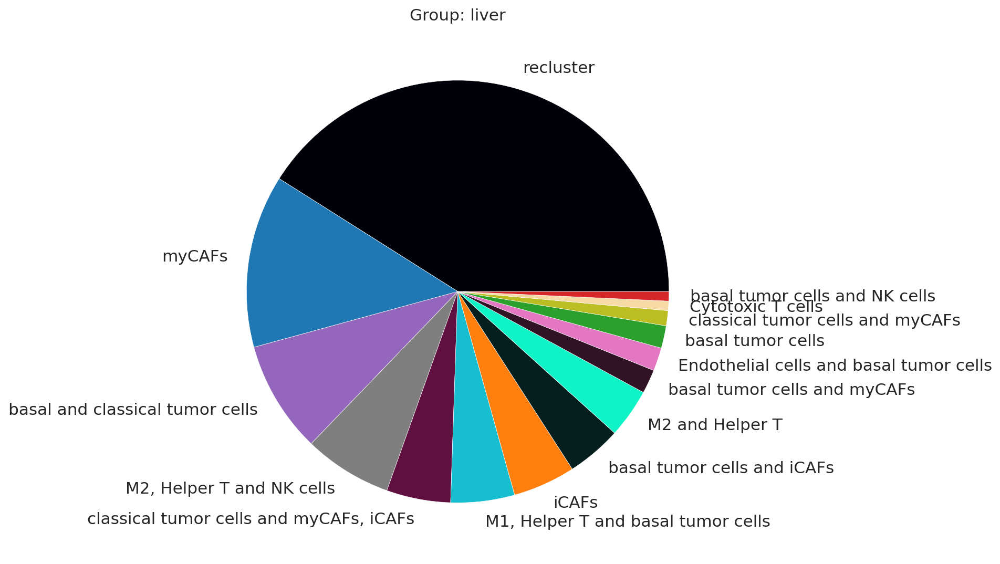

In [61]:
sp.pl.create_pie_charts(
    adata,
    color = "cell_type", 
    grouping = "condition", 
    show_percentages=False,
    palette=cell_type_colors, #default is None which means the color comes from the anndata.uns that matches the UMAP
    savefig=True, # change it to true if you want to save the figure
    output_fname = "cell_type_pie_charts_only_5_5",# change it to file name you prefer when saving the figure
    output_dir = output_dir #output directory for the figure
)
fig = plt.gcf()
fig.set_size_inches(60, 60)
